<a href="https://colab.research.google.com/github/walter789/VPindoor/blob/main/vpIndv211.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



# **Vanishing Point Detection in Indoor Environments using UNet Segmentaion**

Author: Prateek Pal \ GitHub: https://github.com/walter789/VPindoor

GDrive Mounted to collab



In [69]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Load necessary packages
Common python data science packages like numpy, matplotlib and sklearn are imported here [1]. The os package is used for file operations [2].


# **Define functions to extract mat file data and iterate through all mat files**



The scipy package is used for loading MATLAB .mat data files [3]. Custom functions are defined to parse the files and extract segments and vanishinig point associations.

extract_mat_info: Parses a .mat file and returns the vp_association and segments data
iterate_through_directory: Loops through all .mat files in a directory, calls extract_mat_info on each, and returns extracted data

In [119]:
import os
import scipy.io

def extract_mat_info(file_path):
    """Extracts vp_association and segments from a .mat file."""
    data = scipy.io.loadmat(file_path)
    vp_association = data.get('vp_association', [])
    segments = data.get('segments', [])

    return vp_association, segments


Now, we'll create a function to iterate through all the .mat files in the directory:Now, we'll create a function to iterate through all the .mat files in the directory:

In [71]:
def iterate_through_directory(directory_path):
    """Iterates through all .mat files and extracts information."""
    all_data = {}

    for file_name in os.listdir(directory_path):
        if file_name.endswith('.mat'):
            full_path = os.path.join(directory_path, file_name)
            vp_association, segments = extract_mat_info(full_path)
            # Assuming the base file name (without extension) represents the image name
            base_name = os.path.splitext(file_name)[0]
            all_data[base_name] = {
                'vp_association': vp_association,
                'segments': segments
            }

    return all_data

directory_path = '/content/drive/My Drive/VP project v2/dataset/indoor'
extracted_data = iterate_through_directory(directory_path)



# Split dataset into train, validation, and test sets

Stratified splitting of datasets into train/val/test is a common technique in machine learning [4].



In [73]:
import os
import shutil
import random

def split_dataset(dataset_path, train_ratio=0.7, val_ratio=0.15, test_ratio=0.15):
    """Splits the dataset into training, validation, and test sets."""
    # Ensure that the ratios sum to 1
    assert train_ratio + val_ratio + test_ratio == 1, "Ratios must sum to 1!"

    # Create directories for train, val, and test if they don't exist
    train_dir = os.path.join(dataset_path, 'train')
    val_dir = os.path.join(dataset_path, 'val')
    test_dir = os.path.join(dataset_path, 'test')

    for dir_path in [train_dir, val_dir, test_dir]:
        os.makedirs(dir_path, exist_ok=True)

    # List all the images
    image_files = [f for f in os.listdir(dataset_path) if f.endswith('.jpg')]
    random.shuffle(image_files)

    # Calculate the number of images for each set
    n_train = int(len(image_files) * train_ratio)
    n_val = int(len(image_files) * val_ratio)

    # Split the files
    train_files = image_files[:n_train]
    val_files = image_files[n_train:n_train + n_val]
    test_files = image_files[n_train + n_val:]

    # Utility function to move files
    def move_files(files, dest_dir):
        for f in files:
            # Move image
            shutil.copy2(os.path.join(dataset_path, f), os.path.join(dest_dir, f))

    # Move the files to their respective directories
    move_files(train_files, train_dir)
    move_files(val_files, val_dir)
    move_files(test_files, test_dir)




In [74]:
# Call the function to split the dataset
dataset_path = '/content/drive/My Drive/VP project v2/dataset/indoor'


In [75]:
split_dataset(dataset_path)

# Visualize a sample image with segment overlays


Visual inspection of data is recommended as an early step in analysis [5]. Here Matplotlib is used to overlay labeled segments on sample images [6].

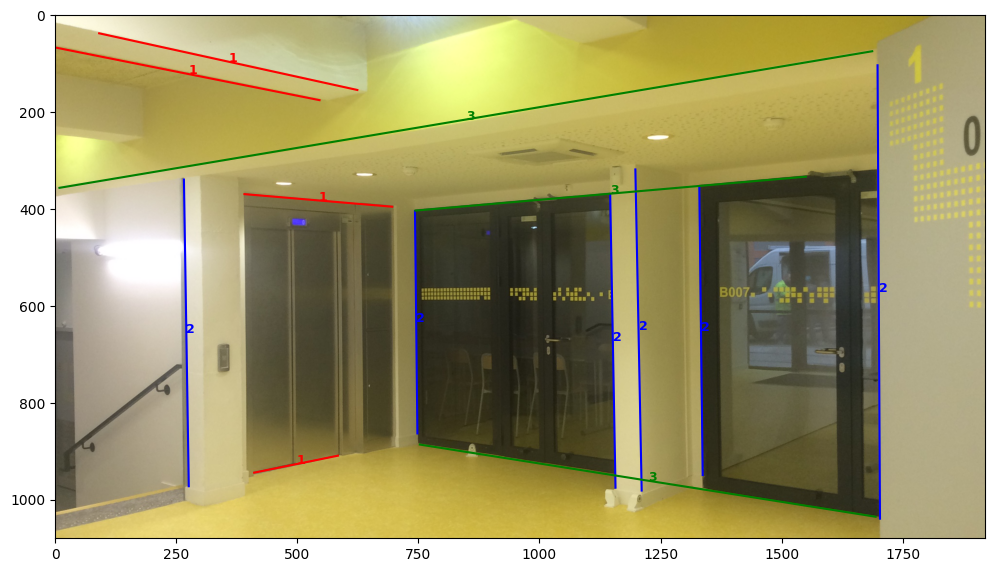

In [76]:
import random
import cv2
import matplotlib.pyplot as plt
import numpy as np
dataset_path = '/content/drive/My Drive/VP project v2/dataset/indoor'
def visualize_sample(image_path, segments, vp_association):
    """Visualizes the image with segments and vanishing points."""

    # Load the image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Create a figure and axis
    fig, ax = plt.subplots(1, figsize=(12, 9))
    ax.imshow(img)

    # Flatten the vp_association for easier iteration
    vp_association_flat = np.array(vp_association).flatten()

    # Define colors for each vanishing point index (1, 2, 3) for distinction
    colors = {1: 'red', 2: 'blue', 3: 'green'}

    # Draw each segment
    for segment, vp_idx in zip(segments, vp_association_flat):
        # Extract segment start and end points
        x1, y1, x2, y2 = segment

        # Plot the segment
        ax.plot([x1, x2], [y1, y2], color=colors[vp_idx])

        # Calculating mid-point of the segment for displaying vanishing point index
        mid_x, mid_y = (x1 + x2) / 2, (y1 + y2) / 2
        ax.text(mid_x, mid_y, str(vp_idx), color=colors[vp_idx], fontsize=9, weight='bold')

    plt.show()
# Choose a random image to visualize
sample_image = random.choice(list(extracted_data.keys()))
# Choose a random image to visualize
visualize_sample(
    os.path.join(dataset_path, sample_image + '.jpg'),
    extracted_data[sample_image]['segments'],
    extracted_data[sample_image]['vp_association']
)


img_1313


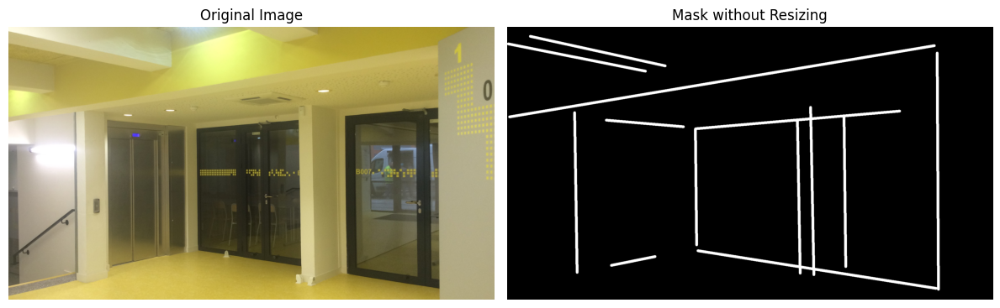

In [77]:
from skimage.transform import resize


sample_image_path = os.path.join(dataset_path, sample_image + '.jpg')

original_img = cv2.imread(sample_image_path)
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

def create_mask_without_resize(segments, image_shape):
    """Creates a binary mask from segments without resizing."""
    mask = np.zeros(image_shape[:2])
    for segment in segments:
        x1, y1, x2, y2 = map(int, segment)
        cv2.line(mask, (x1, y1), (x2, y2), 1, 10)  # Increase the line thickness
    return mask
mask_original = create_mask_without_resize(extracted_data[sample_image]['segments'], original_img.shape)
print(sample_image)
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Display original image
axes[0].imshow(original_img)
axes[0].set_title("Original Image")
axes[0].axis("off")

# Display the mask without resizing
axes[1].imshow(mask_original, cmap='gray')
axes[1].set_title("Mask without Resizing")
axes[1].axis("off")

plt.tight_layout()
plt.show()

# Generate masks from segments and save to folders
Binary masks are commonly used representations for segmentation tasks [7]. The OpenCV library assists in generating masks from segments [8].

In [78]:
import cv2
import numpy as np
from skimage.io import imsave
from skimage import io
from skimage import img_as_ubyte

def generate_and_save_masks(image_directory, mask_directory, extracted_data):
    """Generates masks from the extracted data and saves them."""

    if not os.path.exists(mask_directory):
        os.makedirs(mask_directory)

    for file_name in os.listdir(image_directory):
        if file_name.endswith('.jpg'):
            # Image path
            img_path = os.path.join(image_directory, file_name)

            # Change the extension of the file_name to '.png' for mask
            mask_file_name = os.path.splitext(file_name)[0] + '.png'
            mask_save_path = os.path.join(mask_directory, mask_file_name)

            # Read the image
            img = cv2.imread(img_path)

            # Check if the image was correctly read
            if img is None:
                print(f"Failed to read image at {img_path}. Skipping...")
                continue

            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            # Create mask
            base_name = os.path.splitext(file_name)[0]
            print(base_name)
            if base_name in extracted_data:
                mask = create_mask_without_resize(extracted_data[base_name]['segments'], img.shape)
                # mask_original = create_mask_without_resize(extracted_data[sample_image]['segments'], original_img.shape)
                mask = img_as_ubyte(mask)

                # Use io.imsave to suppress low contrast warnings
                io.imsave(mask_save_path, mask)



In [79]:
# Directory paths
dataset_path = '/content/drive/My Drive/VP project v2/dataset/indoor'
masks_main_dir = os.path.join(dataset_path, 'masks')

# Generate and save masks for train, val, and test
generate_and_save_masks(os.path.join(dataset_path, 'train'), os.path.join(masks_main_dir, 'train'), extracted_data)
generate_and_save_masks(os.path.join(dataset_path, 'val'), os.path.join(masks_main_dir, 'val'), extracted_data)
generate_and_save_masks(os.path.join(dataset_path, 'test'), os.path.join(masks_main_dir, 'test'), extracted_data)


img_1986
img_1995
img_2576
img_2627
img_2641
img_1925
img_1873
img_1850
img_1932
img_2632
img_1983
img_1941
img_1892
img_1866
img_1939
img_2502
img_1295
img_1741
img_1870
img_1825
img_1453
img_1821
img_1796
img_1851
img_1365
img_1306
img_1313
img_1284
img_1924
img_1989
img_1854
img_1929
img_1865
img_2553
img_1884
img_2553
img_1929
img_1884
img_1865
img_1285
img_1854
img_1998
img_1941
img_1995
img_2627
img_1825
img_1864
img_1998
img_2551
img_1989
img_1924
img_1871
img_1936
img_1864
img_1796
img_1850
img_1285
img_2641


# Define data generators for training, validation, and test with image augmentation
Defines generators that load images and masks, apply data augmentation like rotations and flips, and output batched data for training and evaluation.

In [81]:



from tensorflow.keras.preprocessing.image import img_to_array, load_img
import numpy as np
import os
import cv2
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def data_generator(image_dir, mask_dir, batch_size=16, target_size=(256, 256), augment=False):
    image_files = sorted(os.listdir(image_dir))
    total_files = len(image_files)

    if augment:
        datagen = ImageDataGenerator(
            rotation_range=20,
            width_shift_range=0.2,
            height_shift_range=0.2,
            shear_range=0.2,
            zoom_range=0.2,
            horizontal_flip=True,
            fill_mode='nearest')
    else:
        datagen = ImageDataGenerator()

    while True:
        np.random.shuffle(image_files)

        for start in range(0, total_files, batch_size):
            end = min(start + batch_size, total_files)
            batch_images = []
            batch_masks = []

            for i in range(start, end):
                image_path = os.path.join(image_dir, image_files[i])
                mask_path = os.path.join(mask_dir, image_files[i].replace('.jpg', '.png'))

                image = load_img(image_path, target_size=target_size)
                image = img_to_array(image) / 255.0

                # Edge Enhancement
                blurred = cv2.GaussianBlur(image, (0, 0), 3)
                enhanced = cv2.addWeighted(image, 1.5, blurred, -0.5, 0)

                mask = load_img(mask_path, target_size=target_size, color_mode='grayscale')
                mask = img_to_array(mask) / 255.0

                if augment:
                    seed = np.random.randint(1e6)
                    enhanced = datagen.random_transform(enhanced, seed=seed)
                    mask = datagen.random_transform(mask, seed=seed)

                batch_images.append(enhanced)
                batch_masks.append(mask)

            yield np.array(batch_images), np.array(batch_masks)



# Example usage
train_image_path = '/content/drive/My Drive/VP project v2/dataset/indoor/train'
train_mask_path = '/content/drive/My Drive/VP project v2/dataset/indoor/masks/train'

val_image_path = '/content/drive/My Drive/VP project v2/dataset/indoor/val'
val_mask_path = '/content/drive/My Drive/VP project v2/dataset/indoor/masks/val'


test_image_path='/content/drive/My Drive/VP project v2/dataset/indoor/test'
test_mask_path = '/content/drive/My Drive/VP project v2/dataset/indoor/masks/test'


# Create the training generator with data augmentation
train_generator = data_generator(train_image_path, train_mask_path, batch_size=6, augment=True)

# Create the validation and test generators without data augmentation
val_generator = data_generator(val_image_path, val_mask_path, batch_size=6, augment=False)
test_generator = data_generator(test_image_path, test_mask_path, batch_size=6, augment=False)









# Visualize some examples of augmented images and masks
Calls generator and plots some examples to verify augmentation is working.

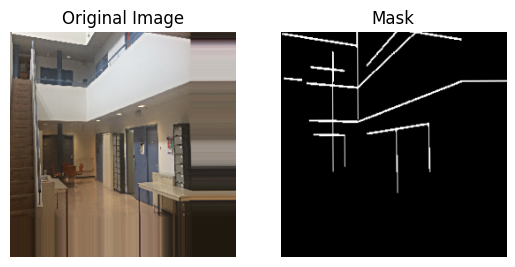

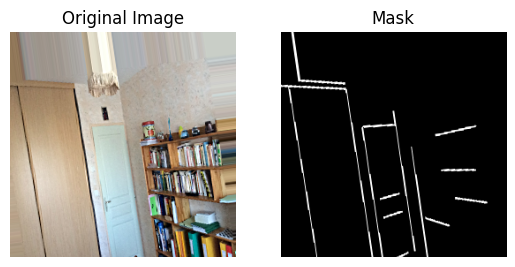

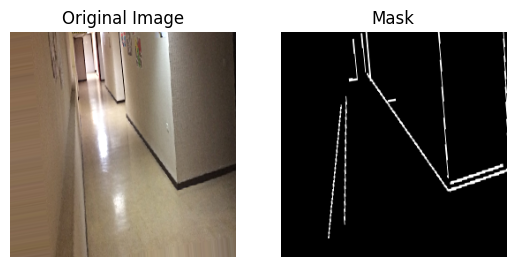

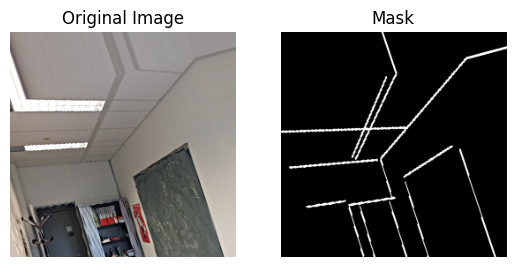

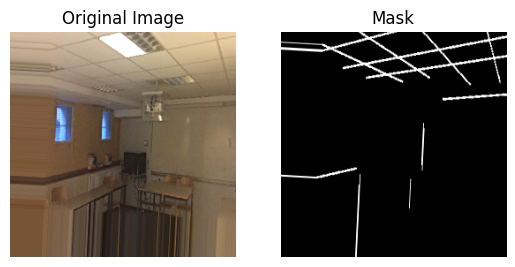

In [82]:
import matplotlib.pyplot as plt

# Get a batch of images and masks from the generator
images, masks = next(train_generator)

# Plot the first few images and masks to verify
for i in range(5): # Adjust as needed
    fig, ax = plt.subplots(1, 2)

    # Original Image
    ax[0].imshow(images[i])
    ax[0].axis('off')
    ax[0].set_title('Original Image')

    # Mask (grayscale)
    ax[1].imshow(masks[i].squeeze(), cmap='gray')
    ax[1].axis('off')
    ax[1].set_title('Mask')

    plt.show()


The U-Net architecture is quite popular for image segmentation, and its structure is designed to capture contextual information from the input images.



# Build U-Net model
The U-Net architecture was first proposed in 2015 for biomedical image segmentation [9]. It is an encoder-decoder type CNN architecture designed for end-to-end segmentation. The model is built here using Keras functional API.

In [84]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dropout, UpSampling2D, concatenate
import random
random.seed(42)

import numpy as np
np.random.seed(42)

import tensorflow as tf
tf.random.set_seed(42)
def create_unet(input_shape=(256, 256, 3)):
    inputs = Input(input_shape)

    # Contracting Path
    c1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
    c1 = Dropout(0.1)(c1)
    c1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = Dropout(0.1)(c2)
    c2 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)

    # Bottleneck
    c3 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = Dropout(0.2)(c3)
    c3 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)

    # Expansive Path
    u4 = UpSampling2D((2, 2))(c3)
    u4 = concatenate([u4, c2])
    c4 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u4)
    c4 = Dropout(0.1)(c4)
    c4 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)

    u5 = UpSampling2D((2, 2))(c4)
    u5 = concatenate([u5, c1])
    c5 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u5)
    c5 = Dropout(0.1)(c5)
    c5 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

    # Final output layer
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c5)

    return Model(inputs=inputs, outputs=outputs)

# Example usage
model = create_unet()
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()


Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_22 (Conv2D)             (None, 256, 256, 32  896         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 dropout_10 (Dropout)           (None, 256, 256, 32  0           ['conv2d_22[0][0]']              
                                )                                                           

# Compile and train U-Net model
Configures model training - optimizer, loss, metrics. Fits model on data generated from previous steps.

With customised callbacks to acheive better results will be using best checkpoint

In [85]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

# Compile the model
model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy'])



# Create callbacks
callbacks = [
    ModelCheckpoint('model_best_checkpoint.h5', save_best_only=True, monitor='val_loss'),
    EarlyStopping(patience=10, monitor='val_loss'),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1, monitor='val_loss')
]



train_image_files = os.listdir(train_image_path)
num_train_images = len(train_image_files)
batch_size = 6

# Train the model using the data generators
history = model.fit(
    train_generator,
    steps_per_epoch=num_train_images // batch_size,
    epochs=50,
    validation_data=val_generator,
    validation_steps=len(os.listdir(val_image_path)) // batch_size,
    callbacks=callbacks
)



# Save the final model
model.save('model_final.h5')


Epoch 1/50
5/5 [==============================] - 59s 11s/step - loss: 0.5116 - accuracy: 0.7997 - val_loss: 0.3578 - val_accuracy: 0.9581 - lr: 1.0000e-04
Epoch 2/50
5/5 [==============================] - 57s 11s/step - loss: 0.2431 - accuracy: 0.9373 - val_loss: 0.2299 - val_accuracy: 0.9583 - lr: 1.0000e-04
Epoch 3/50
5/5 [==============================] - 59s 13s/step - loss: 0.2523 - accuracy: 0.9339 - val_loss: 0.2146 - val_accuracy: 0.9582 - lr: 1.0000e-04
Epoch 4/50
5/5 [==============================] - 60s 12s/step - loss: 0.2291 - accuracy: 0.9396 - val_loss: 0.2387 - val_accuracy: 0.9568 - lr: 1.0000e-04
Epoch 5/50
5/5 [==============================] - 55s 11s/step - loss: 0.2176 - accuracy: 0.9343 - val_loss: 0.2559 - val_accuracy: 0.9582 - lr: 1.0000e-04
Epoch 6/50
5/5 [==============================] - 59s 12s/step - loss: 0.2206 - accuracy: 0.9407 - val_loss: 0.2688 - val_accuracy: 0.9573 - lr: 1.0000e-04
Epoch 7/50
5/5 [==============================] - 60s 12s/step -

# Visualize some predictions on validation set
Makes predictions on validation set and plots them alongside ground truth masks to verify performance.

1/1 [==============================] - 2s 2s/step


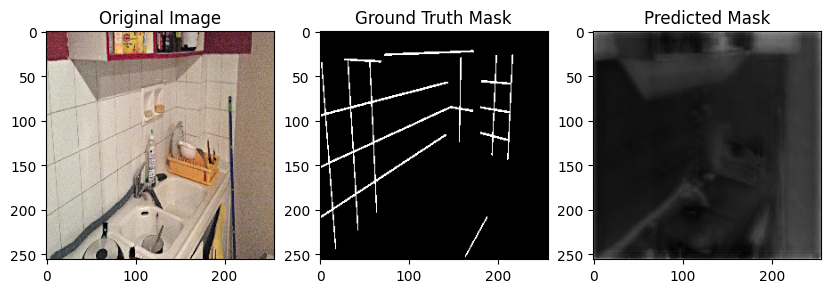

1/1 [==============================] - 2s 2s/step


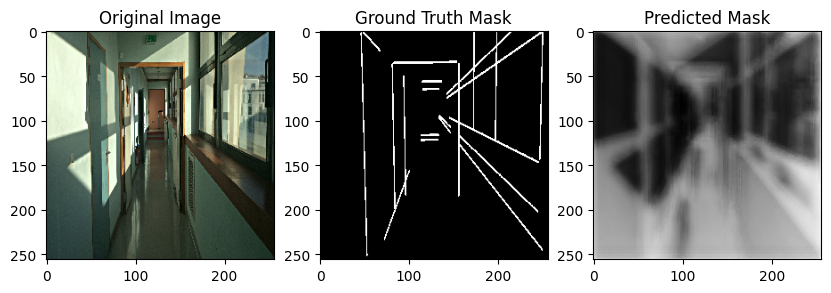

1/1 [==============================] - 2s 2s/step


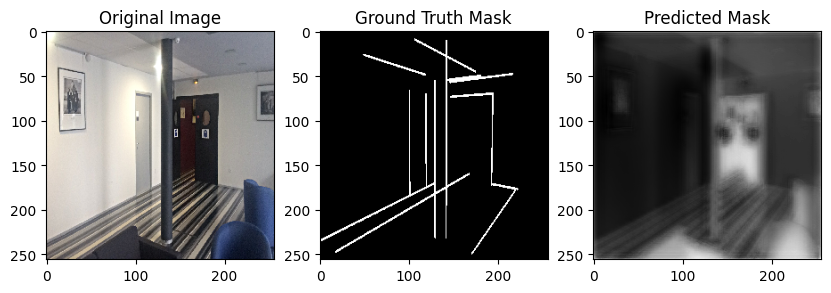

In [86]:
import matplotlib.pyplot as plt

def plot_predictions(model, generator, num_samples=3):
    for i in range(num_samples):
        image, mask = next(generator)
        predicted_mask = model.predict(image)

        plt.figure(figsize=(10, 5))

        # Original image
        plt.subplot(1, 3, 1)
        plt.imshow(image[0])
        plt.title("Original Image")

        # Ground truth mask
        plt.subplot(1, 3, 2)
        plt.imshow(mask[0, :, :, 0], cmap='gray')
        plt.title("Ground Truth Mask")

        # Predicted mask
        plt.subplot(1, 3, 3)
        plt.imshow(predicted_mask[0, :, :, 0], cmap='gray')
        plt.title("Predicted Mask")

        plt.show()

# Example usage
plot_predictions(model, val_generator)


# Switch to dice loss and continue training
Changes the loss function to dice coefficient and continues model training. Dice loss is common for segmentation.

In [87]:
from keras import backend as K

def dice_loss(y_true, y_pred):
    numerator = 2 * K.sum(y_true * y_pred) + 1e-6
    denominator = K.sum(y_true + y_pred) + 1e-6
    return 1 - (numerator / denominator)


In [88]:
model.compile(optimizer='adam', loss=dice_loss, metrics=['accuracy'])


In [89]:
history = model.fit(
    train_generator,
    steps_per_epoch=num_train_images // batch_size,
    epochs=30,
    validation_data=val_generator,
    validation_steps=len(os.listdir(val_image_path)) // batch_size,
    callbacks=callbacks
)



# Save the final model
model.save('model_final.h5')

Epoch 1/30
5/5 [==============================] - 58s 11s/step - loss: 0.9364 - accuracy: 0.4975 - val_loss: 0.9211 - val_accuracy: 0.0418 - lr: 0.0010
Epoch 2/30
5/5 [==============================] - 56s 12s/step - loss: 0.9204 - accuracy: 0.0174 - val_loss: 0.9137 - val_accuracy: 0.0443 - lr: 0.0010
Epoch 3/30
5/5 [==============================] - 56s 12s/step - loss: 0.9248 - accuracy: 0.0170 - val_loss: 0.9182 - val_accuracy: 0.0418 - lr: 0.0010
Epoch 4/30
5/5 [==============================] - 56s 11s/step - loss: 0.9233 - accuracy: 0.0163 - val_loss: 0.9143 - val_accuracy: 0.0440 - lr: 0.0010
Epoch 5/30
5/5 [==============================] - 60s 12s/step - loss: 0.9194 - accuracy: 0.0173 - val_loss: 0.9155 - val_accuracy: 0.0419 - lr: 0.0010
Epoch 6/30
5/5 [==============================] - 56s 11s/step - loss: 0.9211 - accuracy: 0.0574 - val_loss: 0.9101 - val_accuracy: 0.1921 - lr: 0.0010
Epoch 7/30
5/5 [==============================] - 59s 12s/step - loss: 0.9133 - accuracy

# Visualize predictions again after more training
Visualizes predictions after further training to check improvement.

1/1 [==============================] - 2s 2s/step


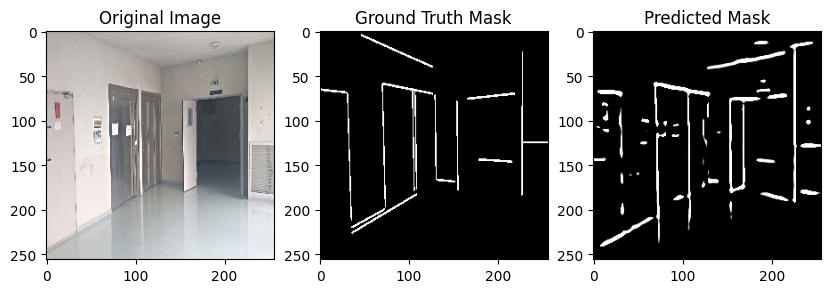

1/1 [==============================] - 2s 2s/step


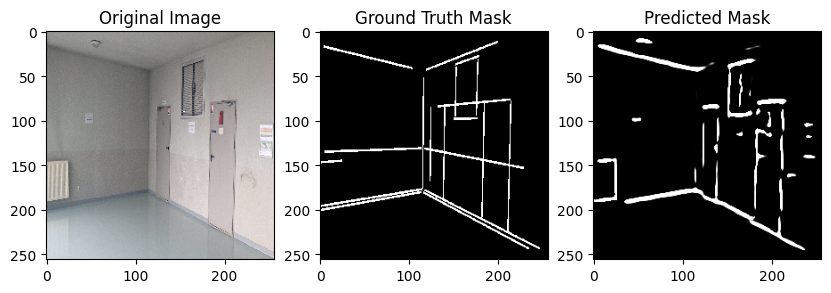

1/1 [==============================] - 2s 2s/step


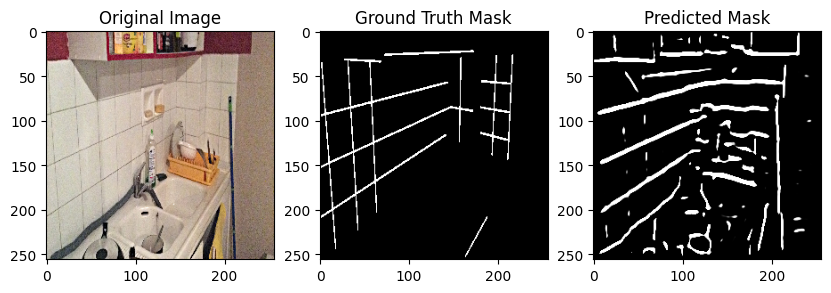

In [90]:
import matplotlib.pyplot as plt

def plot_predictions(model, generator, num_samples=3):
    for i in range(num_samples):
        image, mask = next(generator)
        predicted_mask = model.predict(image)

        plt.figure(figsize=(10, 5))

        # Original image
        plt.subplot(1, 3, 1)
        plt.imshow(image[0])
        plt.title("Original Image")

        # Ground truth mask
        plt.subplot(1, 3, 2)
        plt.imshow(mask[0, :, :, 0], cmap='gray')
        plt.title("Ground Truth Mask")

        # Predicted mask
        plt.subplot(1, 3, 3)
        plt.imshow(predicted_mask[0, :, :, 0], cmap='gray')
        plt.title("Predicted Mask")

        plt.show()

# Example usage
plot_predictions(model, val_generator)


# Utility functions for plotting predictions and overlays
Helper functions like filter by angle to reject nearly vertical lines and thresholding and sharpening the detected edges as too much data is distorted because of resizing and normalizations

In [91]:
import math

def filter_lines_by_angle(lines, angle_threshold=10):
    filtered_lines = []
    for line in lines:
        for x1, y1, x2, y2 in line:
            angle = math.atan2(y2 - y1, x2 - x1) * 180.0 / math.pi
            if abs(angle) > angle_threshold:  # change based on your specific needs
                filtered_lines.append([x1, y1, x2, y2])
    return filtered_lines


In [92]:
# Assuming `val_generator` is your validation data generator and you've trained your `model`.
image, _ = next(val_generator)
predicted_mask = model.predict(image)

# Thresholding predicted_mask
thresholded_mask = (predicted_mask[0, :, :, 0] > 0.5).astype(np.uint8) * 255  # Multiply by 255 to get pixel values in [0, 255]

# Applying HoughLinesP on the thresholded mask
lines = cv2.HoughLinesP(thresholded_mask, 1, np.pi / 180, threshold=50, minLineLength=10, maxLineGap=20)

# Filtering lines based on angle
filtered_lines = filter_lines_by_angle(lines)


1/1 [==============================] - 3s 3s/step


In [93]:
kernel = np.ones((3, 3), np.uint8)
erosion = cv2.erode(thresholded_mask, kernel, iterations=1)


In [94]:
sharpening_filter = np.array([[-1, -1, -1],
                              [-1, 9, -1],
                              [-1, -1, -1]])

sharpened = cv2.filter2D(thresholded_mask, -1, sharpening_filter)


# Vanishing point estimation from predicted lines
Estimates vanishing point from predicted line segments. using **Hough transform** by finding instersection lines of detected edges

Estimated Vanishing Point: (140, -1067)


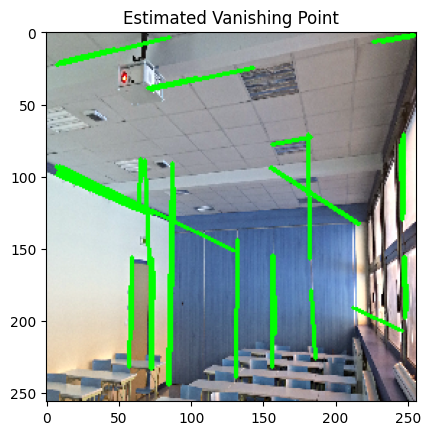

In [95]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def find_intersection(line1, line2):
    x1, y1, x2, y2 = line1
    x3, y3, x4, y4 = line2
    d = (x1-x2)*(y3-y4) - (y1-y2)*(x3-x4)
    if d:
        xi = ((x1*y2-y1*x2)*(x3-x4)-(x1-x2)*(x3*y4-y3*x4)) / d
        yi = ((x1*y2-y1*x2)*(y3-y4)-(y1-y2)*(x3*y4-y3*x4)) / d
        return int(xi), int(yi)
    else:
        return None

def find_vanishing_point(lines):
    intersections = []
    for i, line1 in enumerate(lines):
        for line2 in lines[i+1:]:
            intersection = find_intersection(line1, line2)
            if intersection:  # If lines are not parallel
                intersections.append(intersection)

    # Average out the intersection points to get the vanishing point
    if len(intersections) > 0:
        avg_x = int(np.mean([point[0] for point in intersections]))
        avg_y = int(np.mean([point[1] for point in intersections]))
        return avg_x, avg_y
    else:
        return None

# Using the `filtered_lines` and `image` you got previously
vanishing_point = find_vanishing_point(filtered_lines)
if vanishing_point:
    print("Estimated Vanishing Point:", vanishing_point)

    # Plotting
    for line in filtered_lines:
        x1, y1, x2, y2 = line
        cv2.line(image[0], (x1, y1), (x2, y2), (0, 255, 0), 2)

    cv2.circle(image[0], vanishing_point, 5, (0, 0, 255), -1)  # -1 fills the circle

    plt.imshow(cv2.cvtColor(image[0], cv2.COLOR_BGR2RGB))
    plt.title('Estimated Vanishing Point')
    plt.show()
else:
    print("No vanishing point could be estimated.")


# Image plotting with - canny edges
Shows example of preprocessing input images before feeding to model.

1/1 [==============================] - 2s 2s/step


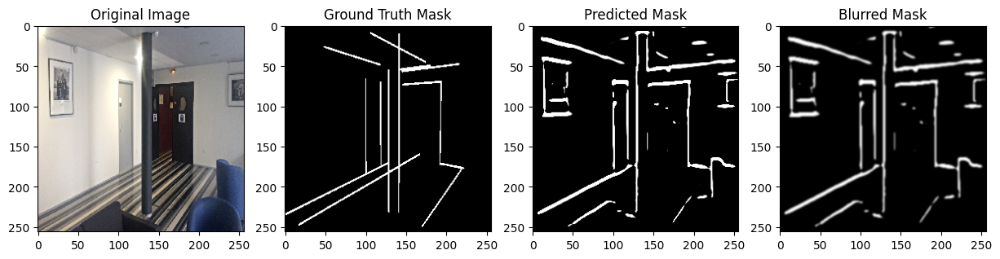

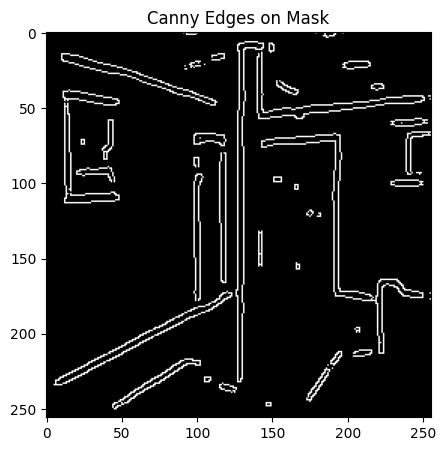

1/1 [==============================] - 2s 2s/step


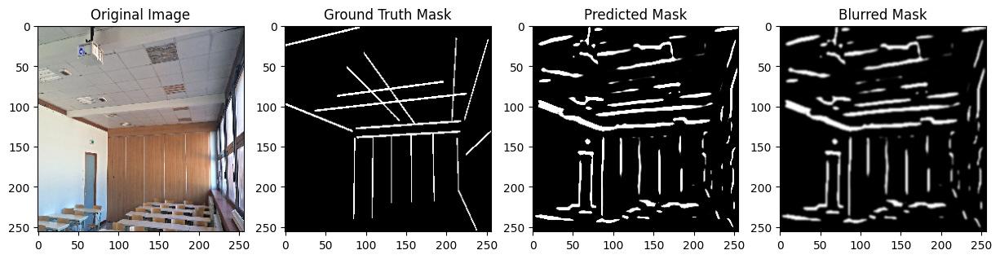

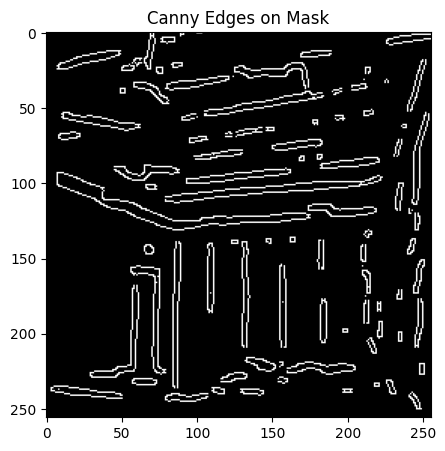

1/1 [==============================] - 2s 2s/step


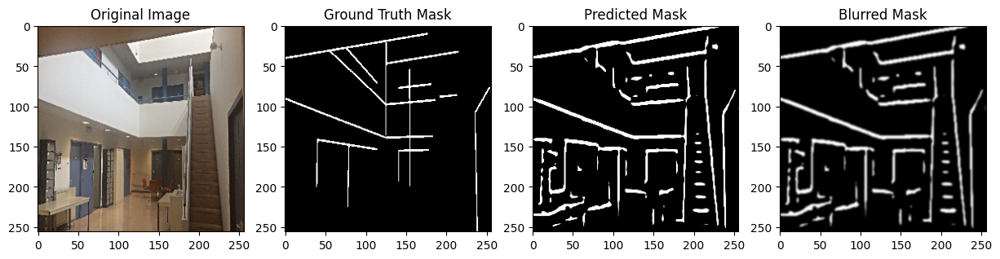

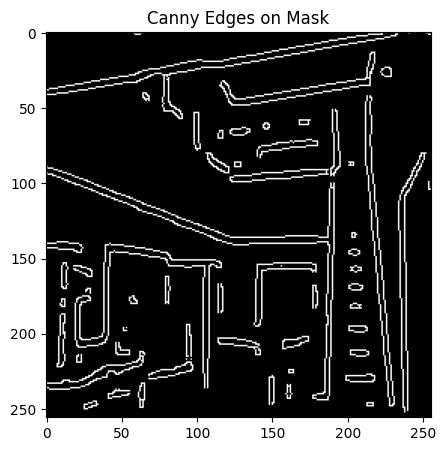

In [97]:
def plot_predictions_and_edges(model, generator, num_samples=3):
    for i in range(num_samples):
        image, mask = next(generator)
        predicted_mask = model.predict(image)

        predicted_mask_image = np.squeeze(predicted_mask[0])  # Remove the batch dimension
        predicted_mask_image = (predicted_mask_image * 255).astype(np.uint8)  # Convert back to 8-bit pixel values

        # Original image
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 4, 1)
        plt.imshow(image[0])
        plt.title("Original Image")

        # Ground truth mask
        plt.subplot(1, 4, 2)
        plt.imshow(mask[0, :, :, 0], cmap='gray')
        plt.title("Ground Truth Mask")

        # Predicted mask
        plt.subplot(1, 4, 3)
        plt.imshow(predicted_mask[0, :, :, 0], cmap='gray')
        plt.title("Predicted Mask")

        # Gaussian blur on Predicted mask
        blurred_mask = cv2.GaussianBlur(predicted_mask_image, (5, 5), 0)
        plt.subplot(1, 4, 4)
        plt.imshow(blurred_mask, cmap='gray')
        plt.title("Blurred Mask")
        plt.show()

        # Canny edges on Blurred mask (new figure for clarity)
        plt.figure(figsize=(5, 5))
        edges = cv2.Canny(blurred_mask, 0, 0)
        plt.imshow(edges, cmap='gray')
        plt.title("Canny Edges on Mask")
        plt.show()

# Example usage
plot_predictions_and_edges(model, val_generator)


# Model with VGG16 encoder


this is another model unet incorporated with vgg16 with pretrained on imagenet.
Builds a U-Net using a VGG16 pre-trained model as the encoder for better features.

In [99]:

import random
# random.seed(42)

import numpy as np
np.random.seed(42)

import tensorflow as tf

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dropout, UpSampling2D, concatenate
from tensorflow.keras.applications import VGG16



def create_unet(input_shape=(256, 256, 3)):
    inputs = Input(input_shape)

    # Initialize the VGG16 model
    base_model = VGG16(weights='imagenet', include_top=False, input_tensor=inputs)
    base_model.trainable = False  # Freeze layers

    # Use a specific layer's output
    vgg_features = base_model.get_layer('block3_conv3').output



    # Contracting Path
    c1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(inputs)
    c1 = Dropout(0.1)(c1)
    c1 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c1)
    p1 = MaxPooling2D((2, 2))(c1)

    c2 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p1)
    c2 = Dropout(0.1)(c2)
    c2 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c2)
    p2 = MaxPooling2D((2, 2))(c2)

    # Concatenating VGG16 features at the bottleneck
    p2 = concatenate([p2, vgg_features])

    # Bottleneck
    c3 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(p2)
    c3 = Dropout(0.2)(c3)
    c3 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c3)

    # Expansive Path
    u4 = UpSampling2D((2, 2))(c3)
    u4 = concatenate([u4, c2])
    c4 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u4)
    c4 = Dropout(0.1)(c4)
    c4 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c4)

    u5 = UpSampling2D((2, 2))(c4)
    u5 = concatenate([u5, c1])
    c5 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(u5)
    c5 = Dropout(0.1)(c5)
    c5 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same')(c5)

    # Final output layer
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c5)
    return Model(inputs=inputs, outputs=outputs)

# Example usage
model1 = create_unet()
model1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model1.summary()


Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 256, 256, 64  1792        ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_33 (Conv2D)             (None, 256, 256, 32  896         ['input_4[0][0]']                
                                )                                                           

In [100]:
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

# Compile the model
model1.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy'])








# Train VGG16 U-Net
Compiles and trains the VGG16 U-Net model.

In [101]:
# Create callbacks
callbacks1 = [
    ModelCheckpoint('model1_best_checkpoint.h5', save_best_only=True, monitor='val_loss'),
    EarlyStopping(patience=10, monitor='val_loss'),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1, monitor='val_loss')
]



train_image_files1 = os.listdir(train_image_path)
num_train_images1 = len(train_image_files1)
batch_size1 = 6

In [102]:


# Train the model using the data generators
history = model1.fit(
    train_generator,
    steps_per_epoch=num_train_images1 // batch_size1,
    epochs=50,
    validation_data=val_generator,
    validation_steps=len(os.listdir(val_image_path)) // batch_size1,
    callbacks=callbacks1
)



# Save the final model
model1.save('model1_final.h5')


Epoch 1/50
5/5 [==============================] - 91s 18s/step - loss: 0.3155 - accuracy: 0.9129 - val_loss: 0.1780 - val_accuracy: 0.9571 - lr: 1.0000e-04
Epoch 2/50
5/5 [==============================] - 77s 16s/step - loss: 0.2143 - accuracy: 0.9268 - val_loss: 0.1664 - val_accuracy: 0.9574 - lr: 1.0000e-04
Epoch 3/50
5/5 [==============================] - 90s 19s/step - loss: 0.1856 - accuracy: 0.9322 - val_loss: 0.1592 - val_accuracy: 0.9579 - lr: 1.0000e-04
Epoch 4/50
5/5 [==============================] - 88s 19s/step - loss: 0.1642 - accuracy: 0.9386 - val_loss: 0.1480 - val_accuracy: 0.9598 - lr: 1.0000e-04
Epoch 5/50
5/5 [==============================] - 78s 16s/step - loss: 0.1706 - accuracy: 0.9341 - val_loss: 0.1513 - val_accuracy: 0.9580 - lr: 1.0000e-04
Epoch 6/50
5/5 [==============================] - 86s 18s/step - loss: 0.1480 - accuracy: 0.9420 - val_loss: 0.1366 - val_accuracy: 0.9607 - lr: 1.0000e-04
Epoch 7/50
5/5 [==============================] - 87s 18s/step -

# Visualize predictions from VGG16 U-Net
Visualizes predictions to see improvement from VGG16 encoder.

1/1 [==============================] - 5s 5s/step


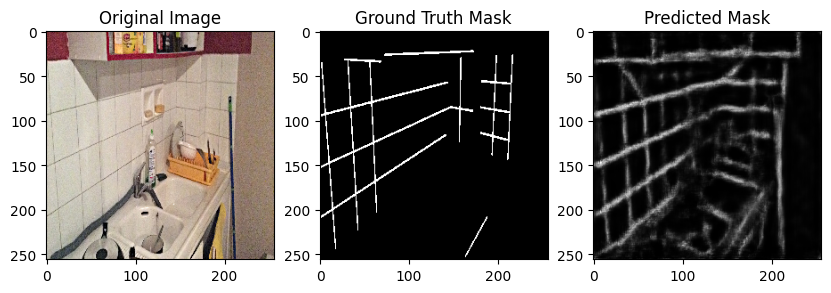

1/1 [==============================] - 6s 6s/step


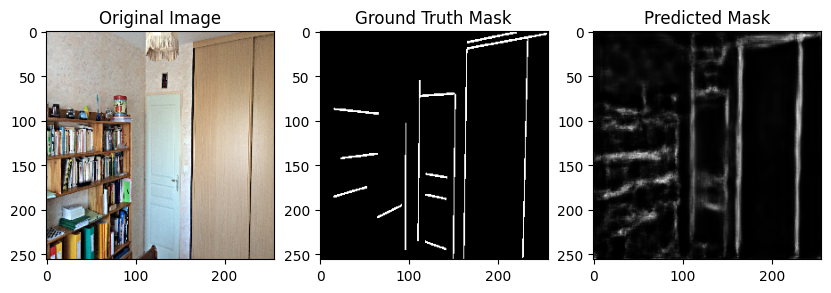

1/1 [==============================] - 4s 4s/step


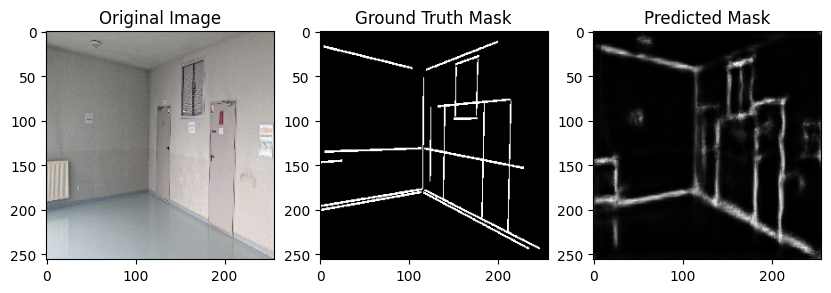

In [103]:
import matplotlib.pyplot as plt

def plot_predictions(model, generator, num_samples=3):
    for i in range(num_samples):
        image, mask = next(generator)
        predicted_mask = model.predict(image)

        plt.figure(figsize=(10, 5))

        # Original image
        plt.subplot(1, 3, 1)
        plt.imshow(image[0])
        plt.title("Original Image")

        # Ground truth mask
        plt.subplot(1, 3, 2)
        plt.imshow(mask[0, :, :, 0], cmap='gray')
        plt.title("Ground Truth Mask")

        # Predicted mask
        plt.subplot(1, 3, 3)
        plt.imshow(predicted_mask[0, :, :, 0], cmap='gray')
        plt.title("Predicted Mask")

        plt.show()

# Example usage
plot_predictions(model1, val_generator)


# Overlay predictions on original images
Helper function to overlay model predictions on original image.

1/1 [==============================] - 6s 6s/step


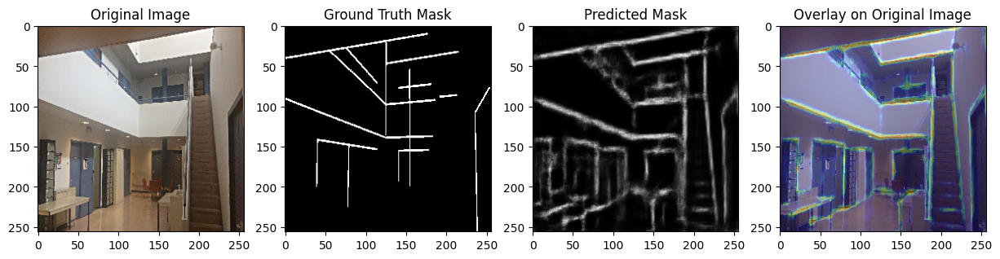

1/1 [==============================] - 5s 5s/step


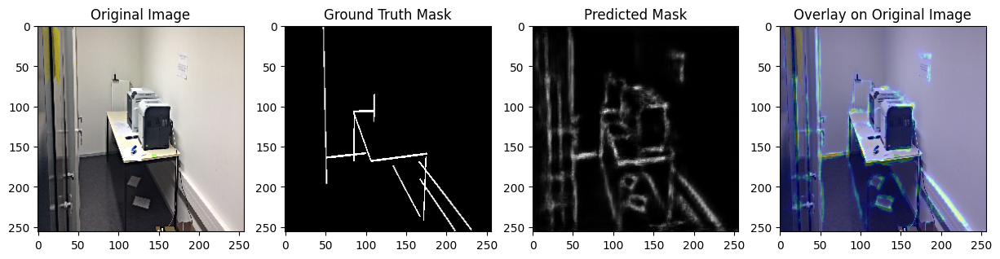

1/1 [==============================] - 5s 5s/step


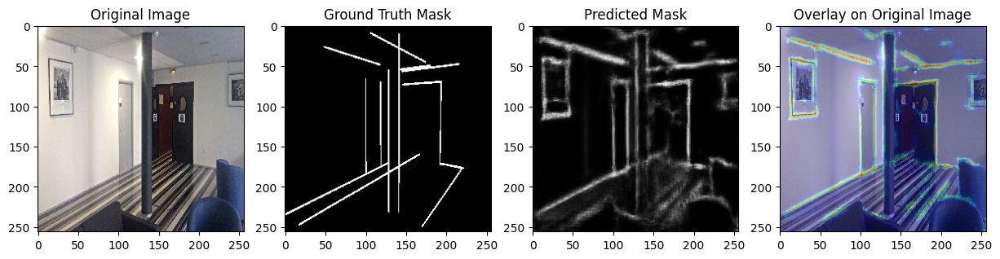

In [104]:
import matplotlib.pyplot as plt

def plot_predictions_with_overlay(model, generator, num_samples=3):
    for i in range(num_samples):
        image, mask = next(generator)
        predicted_mask = model.predict(image)

        plt.figure(figsize=(15, 5))

        # Original image
        plt.subplot(1, 4, 1)
        plt.imshow(image[0])
        plt.title("Original Image")

        # Ground truth mask
        plt.subplot(1, 4, 2)
        plt.imshow(mask[0, :, :, 0], cmap='gray')
        plt.title("Ground Truth Mask")

        # Predicted mask
        plt.subplot(1, 4, 3)
        plt.imshow(predicted_mask[0, :, :, 0], cmap='gray')
        plt.title("Predicted Mask")

        # Overlay predicted mask on original
        plt.subplot(1, 4, 4)
        plt.imshow(image[0])
        plt.imshow(predicted_mask[0, :, :, 0], cmap='jet', alpha=0.3) # 0.3 is the transparency level
        plt.title("Overlay on Original Image")

        plt.show()

# Example usage
plot_predictions_with_overlay(model1, val_generator)


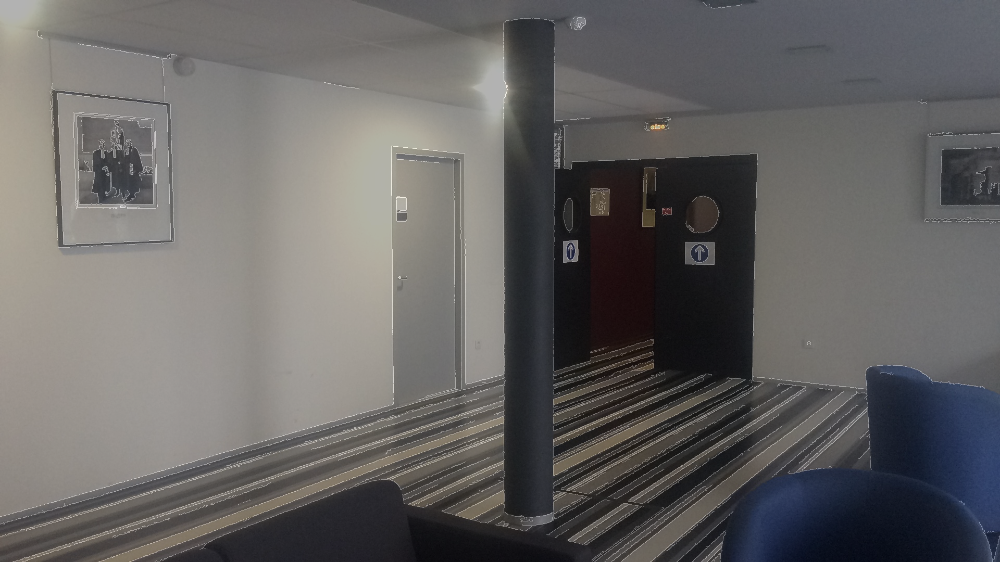

In [105]:
import cv2

from google.colab.patches import cv2_imshow




def preprocess_image(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 50, 150)
    return cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR)


original_image = cv2.imread("/content/drive/My Drive/VP project v2/dataset/indoor/val/img_1285.jpg")
processed_image = preprocess_image(original_image)


if len(processed_image.shape) == 2:
    processed_image = cv2.cvtColor(processed_image, cv2.COLOR_GRAY2BGR)

# Blend the images
alpha = 0.7  # weight for original_image
beta = 0.3  # weight for processed_image
gamma = 0  # scalar added to each sum

blended_image = cv2.addWeighted(original_image, alpha, processed_image, beta, gamma)

# Show the blended image

cv2_imshow(blended_image)




Edge detection on predicted masks
Applies canny edge detection on the predicted masks.

Trained again for 30 more epochs as didn't get expected results

In [106]:
# Compile the model
model1.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy'])

# Update callbacks with more patience for EarlyStopping
callbacks1 = [
    ModelCheckpoint('model1_best_checkpoint.h5', save_best_only=True, monitor='val_loss'),
    EarlyStopping(patience=15, monitor='val_loss'),  # Increased patience
    ReduceLROnPlateau(factor=0.1, patience=8, min_lr=0.00001, verbose=1, monitor='val_loss')  # Increased patience
]

train_image_files1 = os.listdir(train_image_path)
num_train_images1 = len(train_image_files1)
batch_size1 = 6

# Train the model using the data generators, but for more epochs this time
history = model1.fit(
    train_generator,
    steps_per_epoch=num_train_images1 // batch_size1,
    epochs=30,  # Increased number of epochs
    validation_data=val_generator,
    validation_steps=len(os.listdir(val_image_path)) // batch_size1,
    callbacks=callbacks1
)

# Save the final model
model1.save('model1_final.h5')


Epoch 1/30
5/5 [==============================] - 91s 19s/step - loss: 0.1418 - accuracy: 0.9373 - val_loss: 0.1314 - val_accuracy: 0.9582 - lr: 1.0000e-04
Epoch 2/30
5/5 [==============================] - 81s 17s/step - loss: 0.1423 - accuracy: 0.9342 - val_loss: 0.1279 - val_accuracy: 0.9616 - lr: 1.0000e-04
Epoch 3/30
5/5 [==============================] - 87s 19s/step - loss: 0.1416 - accuracy: 0.9366 - val_loss: 0.1280 - val_accuracy: 0.9582 - lr: 1.0000e-04
Epoch 4/30
5/5 [==============================] - 78s 16s/step - loss: 0.1254 - accuracy: 0.9429 - val_loss: 0.1228 - val_accuracy: 0.9606 - lr: 1.0000e-04
Epoch 5/30
5/5 [==============================] - 88s 19s/step - loss: 0.1408 - accuracy: 0.9336 - val_loss: 0.1278 - val_accuracy: 0.9583 - lr: 1.0000e-04
Epoch 6/30
5/5 [==============================] - 78s 16s/step - loss: 0.1270 - accuracy: 0.9410 - val_loss: 0.1378 - val_accuracy: 0.9530 - lr: 1.0000e-04
Epoch 7/30
5/5 [==============================] - 86s 18s/step -

1/1 [==============================] - 5s 5s/step


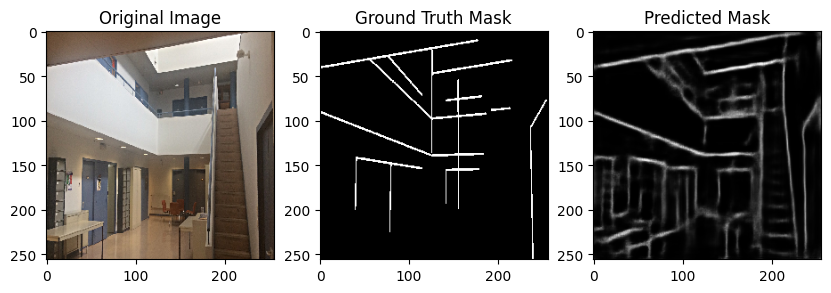

1/1 [==============================] - 6s 6s/step


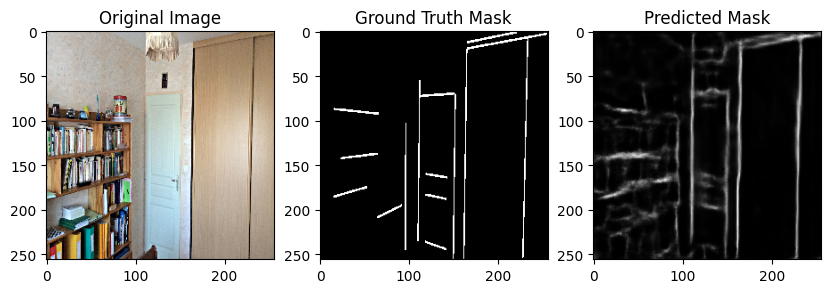

1/1 [==============================] - 4s 4s/step


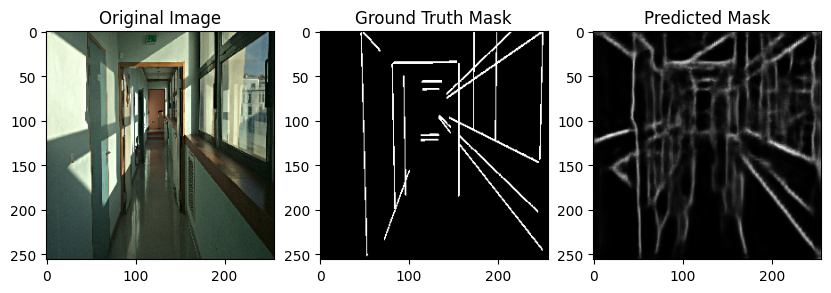

In [107]:
import matplotlib.pyplot as plt

def plot_predictions(model, generator, num_samples=3):
    for i in range(num_samples):
        image, mask = next(generator)
        predicted_mask = model.predict(image)

        plt.figure(figsize=(10, 5))

        # Original image
        plt.subplot(1, 3, 1)
        plt.imshow(image[0])
        plt.title("Original Image")

        # Ground truth mask
        plt.subplot(1, 3, 2)
        plt.imshow(mask[0, :, :, 0], cmap='gray')
        plt.title("Ground Truth Mask")

        # Predicted mask
        plt.subplot(1, 3, 3)
        plt.imshow(predicted_mask[0, :, :, 0], cmap='gray')
        plt.title("Predicted Mask")

        plt.show()

# Example usage
plot_predictions(model1, val_generator)


1/1 [==============================] - 6s 6s/step


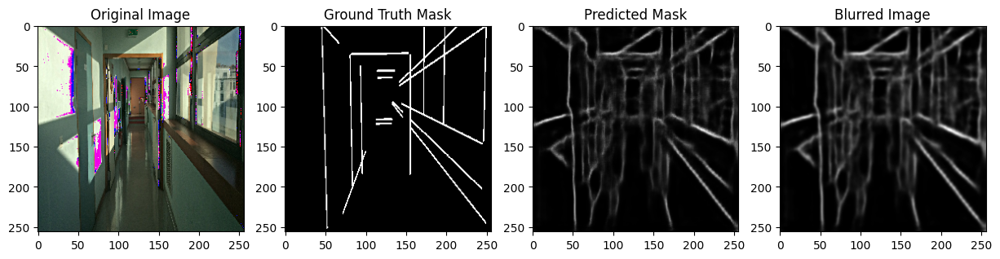

1/1 [==============================] - 4s 4s/step


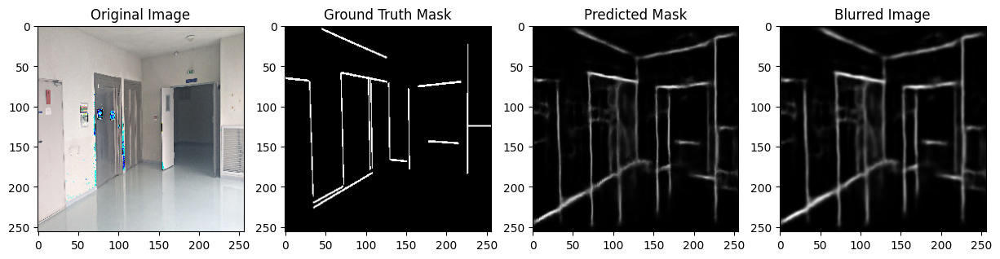

1/1 [==============================] - 6s 6s/step


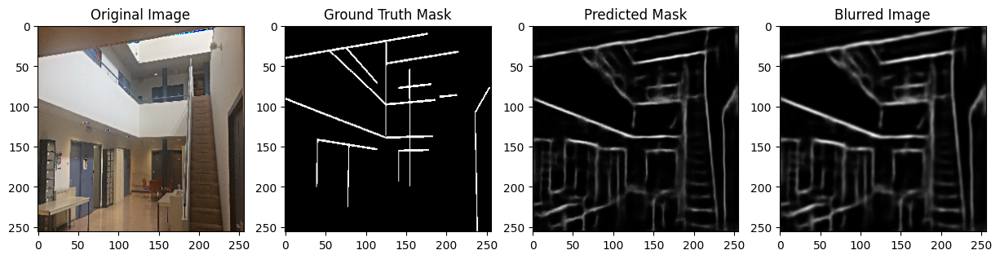

In [110]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

def plot_predictions_and_edges(model, generator, num_samples=3):
    for i in range(num_samples):
        image, mask = next(generator)
        predicted_mask = model.predict(image)
        predicted_mask_image = np.squeeze(predicted_mask[0])  # Remove the batch dimension
        predicted_mask_image = (predicted_mask_image * 255).astype(np.uint8)  # Convert back to 8-bit pixel values


        image = np.squeeze(image[0])  # Remove the batch dimension
        image = (image * 255).astype(np.uint8)  # Convert back to 8-bit pixel values

        # Original image
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 4, 1)
        plt.imshow(image)
        plt.title("Original Image")

        # Ground truth mask
        plt.subplot(1, 4, 2)
        plt.imshow(mask[0, :, :, 0], cmap='gray')
        plt.title("Ground Truth Mask")

        # Predicted mask
        plt.subplot(1, 4, 3)
        plt.imshow(predicted_mask[0, :, :, 0], cmap='gray')
        plt.title("Predicted Mask")

        # Gaussian blur
        blurred_image = cv2.GaussianBlur(predicted_mask_image, (5, 5), 0)
        plt.subplot(1, 4, 4)
        plt.imshow(blurred_image, cmap='gray')
        plt.title("Blurred Image")
        plt.show()



# Example usage
plot_predictions_and_edges(model1, val_generator)


In [111]:
sharpening_filter = np.array([[-1, -1, -1],
                              [-1, 9, -1],
                              [-1, -1, -1]])

sharpened = cv2.filter2D(thresholded_mask, -1, sharpening_filter)

# Vanishing point estimation from predicted lines
Estimates vanishing point from predicted line segments. using **hough transform**
for new model

Estimated Vanishing Point: (140, -1067)


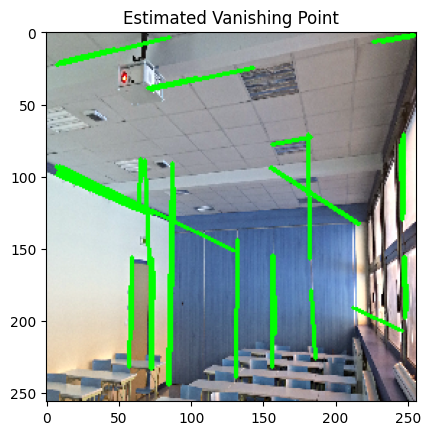

In [112]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def find_intersection(line1, line2):
    x1, y1, x2, y2 = line1
    x3, y3, x4, y4 = line2
    d = (x1-x2)*(y3-y4) - (y1-y2)*(x3-x4)
    if d:
        xi = ((x1*y2-y1*x2)*(x3-x4)-(x1-x2)*(x3*y4-y3*x4)) / d
        yi = ((x1*y2-y1*x2)*(y3-y4)-(y1-y2)*(x3*y4-y3*x4)) / d
        return int(xi), int(yi)
    else:
        return None

def find_vanishing_point(lines):
    intersections = []
    for i, line1 in enumerate(lines):
        for line2 in lines[i+1:]:
            intersection = find_intersection(line1, line2)
            if intersection:  # If lines are not parallel
                intersections.append(intersection)

    # Average out the intersection points to get the vanishing point
    if len(intersections) > 0:
        avg_x = int(np.mean([point[0] for point in intersections]))
        avg_y = int(np.mean([point[1] for point in intersections]))
        return avg_x, avg_y
    else:
        return None

# Using the `filtered_lines` and `image` you got previously
vanishing_point = find_vanishing_point(filtered_lines)
if vanishing_point:
    print("Estimated Vanishing Point:", vanishing_point)

    # Plotting
    for line in filtered_lines:
        x1, y1, x2, y2 = line
        cv2.line(image[0], (x1, y1), (x2, y2), (0, 255, 0), 2)

    cv2.circle(image[0], vanishing_point, 5, (0, 0, 255), -1)  # -1 fills the circle

    plt.imshow(cv2.cvtColor(image[0], cv2.COLOR_BGR2RGB))
    plt.title('Estimated Vanishing Point')
    plt.show()
else:
    print("No vanishing point could be estimated.")


# Visualize predictions from VGG16 U-Net
Visualizes predictions to see improvement from VGG16 encoder.for last time using gaussian blurr on predicted masks as canny edge detector was not effective

1/1 [==============================] - 4s 4s/step


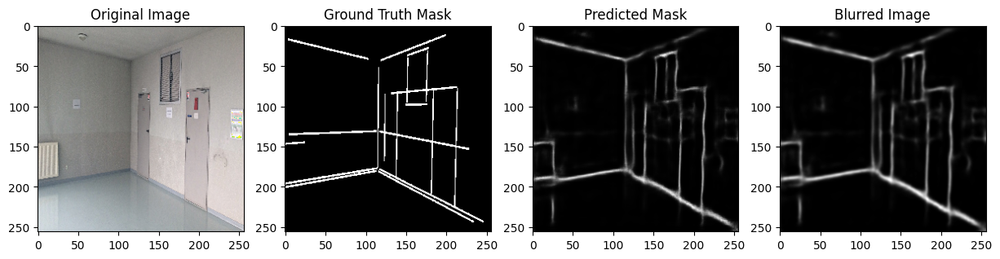

1/1 [==============================] - 4s 4s/step


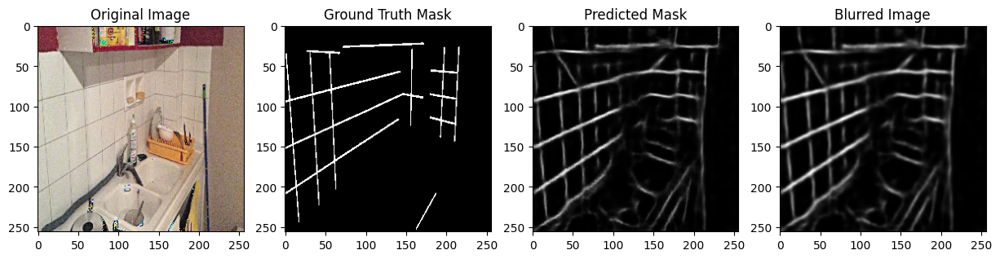

1/1 [==============================] - 6s 6s/step


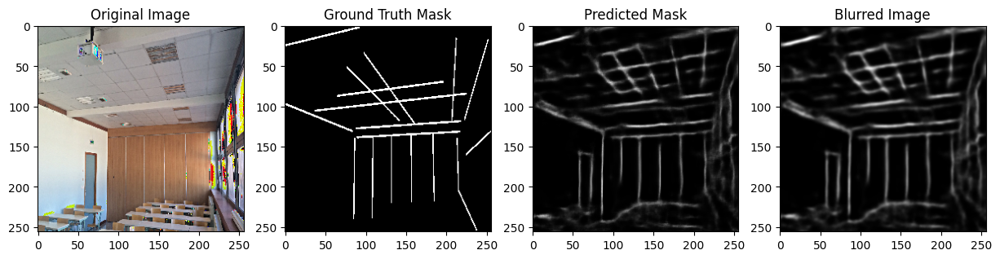

In [113]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

def plot_predictions_and_edges(model, generator, num_samples=3):
    for i in range(num_samples):
        image, mask = next(generator)
        predicted_mask = model.predict(image)
        predicted_mask_image = np.squeeze(predicted_mask[0])  # Remove the batch dimension
        predicted_mask_image = (predicted_mask_image * 255).astype(np.uint8)  # Convert back to 8-bit pixel values


        image = np.squeeze(image[0])  # Remove the batch dimension
        image = (image * 255).astype(np.uint8)  # Convert back to 8-bit pixel values

        # Original image
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 4, 1)
        plt.imshow(image)
        plt.title("Original Image")

        # Ground truth mask
        plt.subplot(1, 4, 2)
        plt.imshow(mask[0, :, :, 0], cmap='gray')
        plt.title("Ground Truth Mask")

        # Predicted mask
        plt.subplot(1, 4, 3)
        plt.imshow(predicted_mask[0, :, :, 0], cmap='gray')
        plt.title("Predicted Mask")

        # Gaussian blur
        blurred_image = cv2.GaussianBlur(predicted_mask_image, (5, 5), 0)
        plt.subplot(1, 4, 4)
        plt.imshow(blurred_image, cmap='gray')
        plt.title("Blurred Image")
        plt.show()



# Example usage
plot_predictions_and_edges(model1, val_generator)


# Compute F1 scores for both models
Computes F1 scores to evaluate and compare models.

In [116]:
from sklearn.metrics import f1_score
import numpy as np

def calculate_f1(model, generator, num_samples=100):
    f1_scores = []

    for i in range(num_samples):
        image, true_mask = next(generator)
        predicted_mask = model.predict(image)

        # Flatten and binarize the masks and the predictions
        y_true_flat = true_mask.flatten()
        y_pred_flat = (predicted_mask.flatten() > 0.5).astype(int)

        # Compute F1 score for this sample
        f1 = f1_score(y_true_flat, y_pred_flat)
        f1_scores.append(f1)

    return np.mean(f1_scores)

# Compute average F1 scores
f1_model = calculate_f1(model, val_generator)
f1_model1 = calculate_f1(model1, val_generator)

print(f'Average F1 Score for model: {f1_model}')
print(f'Average F1 Score for model1: {f1_model1}')


1/1 [==============================] - 4s 4s/step
Average F1 Score for model: 0.34120117249966186
Average F1 Score for model1: 0.21738884721728752


model has an average F1 Score of approximately 0.341
model1 has an average F1 Score of approximately 0.217
From these metrics, it appears that model performs better than model1 in terms of the F1 score. A higher F1 score indicates a better harmonic mean between precision and recall, which is often a good indicator of model performance for imbalanced or binary classification problems.

# Compute normalized confusion matrices
Generates confusion matrices for both models for further evaluation.

1/1 [==============================] - 6s 6s/step


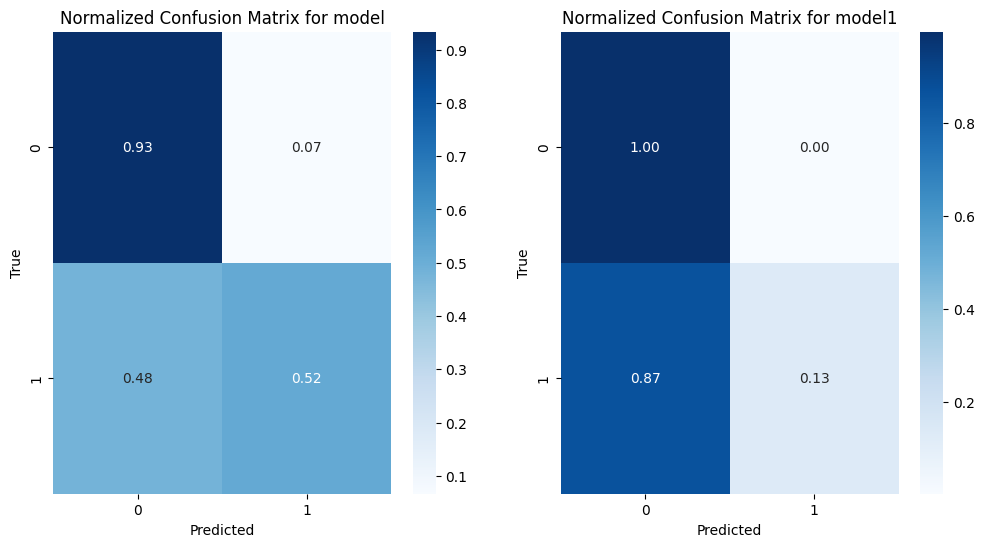

In [118]:
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import normalize

def calculate_normalized_confusion_matrix(model, generator, num_samples=50):
    y_true_all = []
    y_pred_all = []

    for i in range(num_samples):
        image, true_mask = next(generator)
        predicted_mask = model.predict(image)

        # Flatten and binarize the masks and the predictions
        y_true_flat = true_mask.flatten()
        y_pred_flat = (predicted_mask.flatten() > 0.5).astype(int)

        y_true_all.extend(y_true_flat)
        y_pred_all.extend(y_pred_flat)

    cm = confusion_matrix(y_true_all, y_pred_all)
    cm_normalized = normalize(cm, axis=1, norm='l1')  # Row normalization
    return cm_normalized

# Compute and plot normalized confusion matrices
cm_norm_model = calculate_normalized_confusion_matrix(model, val_generator)
cm_norm_model1 = calculate_normalized_confusion_matrix(model1, val_generator)

# Plotting
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.heatmap(cm_norm_model, annot=True, fmt='.2f', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Normalized Confusion Matrix for model')

plt.subplot(1, 2, 2)
sns.heatmap(cm_norm_model1, annot=True, fmt='.2f', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Normalized Confusion Matrix for model1')

plt.show()


# Interpretation for "model":
True Negative Rate (Specificity): 93% of the negative cases were correctly identified.
True Positive Rate (Sensitivity/Recall): 52% of the positive cases were correctly identified.
F1 Score: 0.34, it combines precision and recall into a single number. An F1 Score ranges between 0 and 1, and a higher value indicates better performance. Your F1 score suggests that the model could be improved, especially given that F1 scores close to 1.0 indicate strong model performance.
# Interpretation for "model1":
True Negative Rate (Specificity): 100% of the negative cases were correctly identified.
True Positive Rate (Sensitivity/Recall): Only 13% of the positive cases were correctly identified.
F1 Score: 0.22, this score is lower than that of the first model, indicating worse performance, especially on identifying positive cases (as can also be seen in the confusion matrix).

**References**

[1] Van Der Walt, S., Colbert, S.C., & Varoquaux, G. (2011). The NumPy array: a structure for efficient numerical computation. Computing in Science & Engineering, 13(2), 22-30.

[2] Python Documentation. os — Miscellaneous operating system interfaces. https://docs.python.org/3/library/os.html

[3] Jones, E., Oliphant, T., & Peterson, P. (2001). SciPy: Open source scientific tools for Python. http://www.scipy.org/

[5] Tukey, J. W. (1977). Exploratory data analysis. Reading, Mass.

[6] Hunter, J. D. (2007). Matplotlib: A 2D graphics environment. Computing in science & engineering, 9(3), 90-95.

[7] Long, J., Shelhamer, E., & Darrell, T. (2015). Fully convolutional networks for semantic segmentation. In Proceedings of the IEEE conference on computer vision and pattern recognition (pp. 3431-3440).

[8] Bradski, G. (2000). The opencv library. Dr. Dobb’s Journal of Software Tools.

[9] Ronneberger, O., Fischer, P., & Brox, T. (2015, October). U-net: Convolutional networks for biomedical image segmentation. In International Conference on Medical image computing and computer-assisted intervention (pp. 234-241). Springer, Cham.

_______________________________________________________________________________________________________________________________________________________________________________________________________________________________________________

___________________________________________________________________________________